![evolution-of-ct-density-of-intracranial-haemorrhage-diagram.jpeg](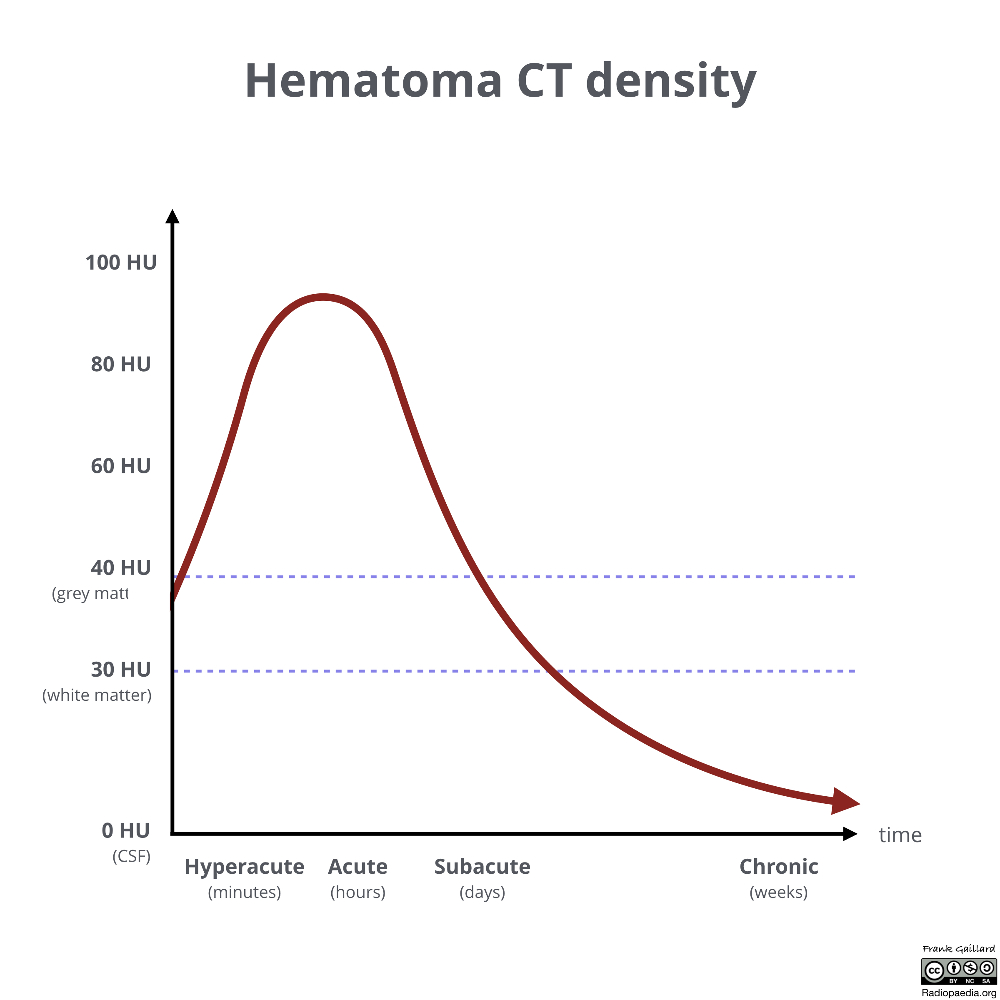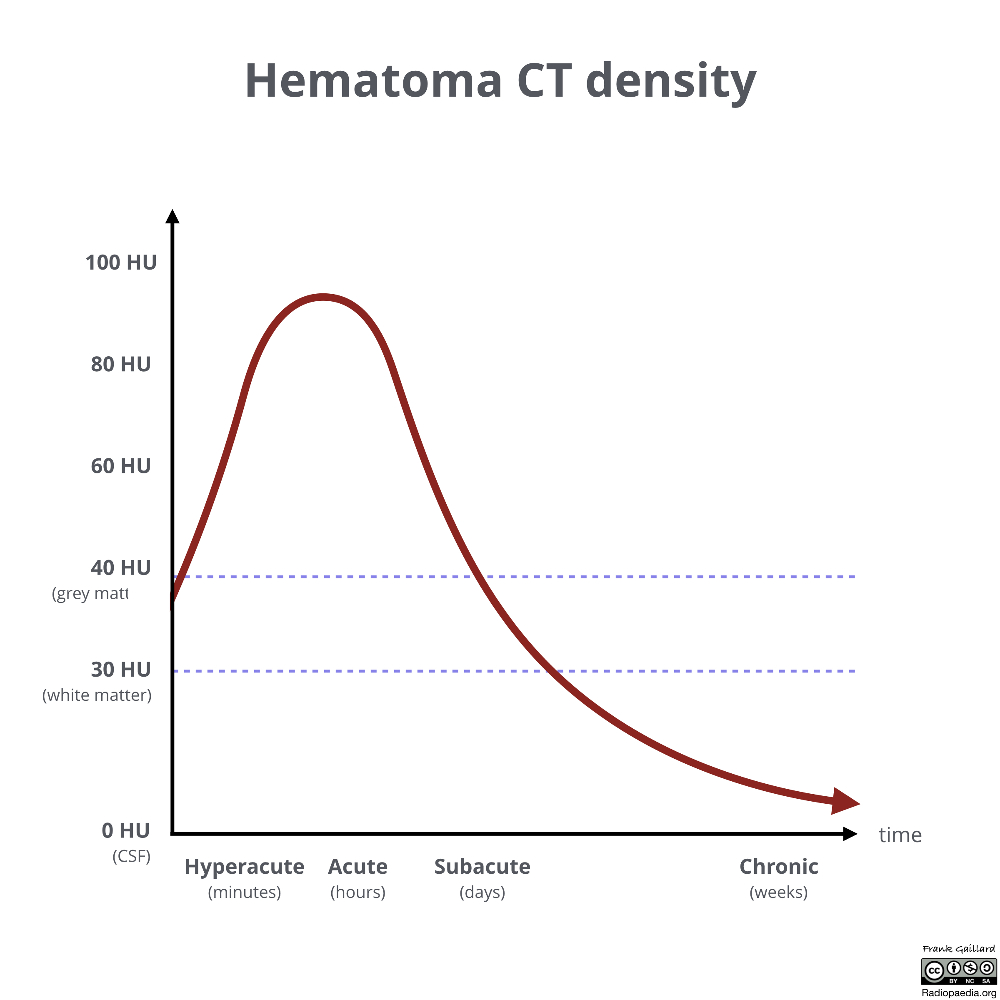)

In [45]:
from random import randint

import numpy as np

import nibabel as nib
import nilearn as nl
import nilearn.plotting as nlplt

import matplotlib.pyplot as plt
from matplotlib import cm
import matplotlib.animation as anim
from mpl_toolkits.mplot3d.art3d import Poly3DCollection
from skimage import measure

from skimage.transform import resize
from skimage.util import montage

from IPython.display import Image as show_gif

import warnings
warnings.simplefilter("ignore")

In [5]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


A CT felvételt a https://physionet.org/content/ct-ich/1.3.1/#files-panel oldalról szedtem. Az oldalon található felvételek anonimizáltak, a személyes adatok ki vannak törölve a meta adatokból illetve a felvételeken szereplő személyeak arcai el van homlyosítva.

---
A felvétel felbontása (512, 512, 33), ami azt jelenti, hogy 33 szeletből áll, a szeletek felbontása 512 * 512.
A CT felvételekből rengeteg meta információ kinyerhető, én most csak a szelet vastagságot (a szeletek között hány miliméter van a valóságban) és az egyes szeleteken belül a pixelek között távolságot (szintén milliméterben). Ezeknek az számoknak késöbb a resampling során lesz szerepük.

In [17]:
path = '/content/drive/MyDrive/080.nii'
mask_path = '/content/drive/MyDrive/080(1).nii'

image = nib.load(path)

slice_thickness = image.header['pixdim'][3]
pixel_spacing = image.header['pixdim'][1:3]
image = np.asanyarray(image.dataobj)

mask = nib.load(mask_path)
mask = np.asanyarray(mask.dataobj)

print("img shape ->", image.shape)
print("mask shape ->", mask.shape)
print("slice thickness ->", slice_thickness)
print("pixel spacing ->", pixel_spacing)

img shape -> (512, 512, 33)
mask shape -> (512, 512, 33)
slice thickness -> 5.0
pixel spacing -> [0.4609375 0.4609375]


Az ImageToGif osztály egy voxel tömböt tud gif formátumba konvertálni, a felvételt adott síkból nézve végig iterál a szeleteken és ebből egy animációt csinál.

In [18]:
class ImageToGIF:
    def __init__(self,
                 size=(600, 400),
                 xy_text=(80, 10),
                 dpi=100,
                 cmap=plt.cm.gray):

        self.fig = plt.figure()
        self.fig.set_size_inches(size[0] / dpi, size[1] / dpi)
        self.xy_text = xy_text
        self.cmap = cmap
        self.ax = self.fig.add_axes([0, 0, 1, 1])
        self.ax.set_xticks([])
        self.ax.set_yticks([])
        self.images = []

    def add(self, *args, label, with_mask=True):
        image = args[0]
        mask = args[-1]
        plt.set_cmap(self.cmap)
        plt_img = self.ax.imshow(image, animated=True)
        if with_mask:
            plt_mask = self.ax.imshow(np.ma.masked_where(mask == False, mask),
                                      alpha=0.5, animated=True)
        plt_text = self.ax.text(*self.xy_text, label, color='red')
        to_plot = [plt_img, plt_mask, plt_text] if with_mask else [plt_img, plt_text]
        self.images.append(to_plot)
        plt.close()

    def save(self, filename, fps):
        animation = anim.ArtistAnimation(self.fig, self.images)
        animation.save(filename, writer='imagemagick', fps=fps)


Egy hisztogram segíségével meg tudjuk vizsgálni, hogy az egyes Hounsfield értékek mekkora gyakorisággal szereplenek a képen.  
Pár jelenleg fontos szövet HU intervalluma:

*   Tömör csont     300 - 2500
*   Vér             50 - 60
*   Szürke állomány 35 - 40
*   Fehér állomány  25 - 30
*   Víz             0
*   Levegő          -1000

Az alábbi képen az látható hogy hogyan változik a vér Hounsfield értéke az alavadás folyamat során:
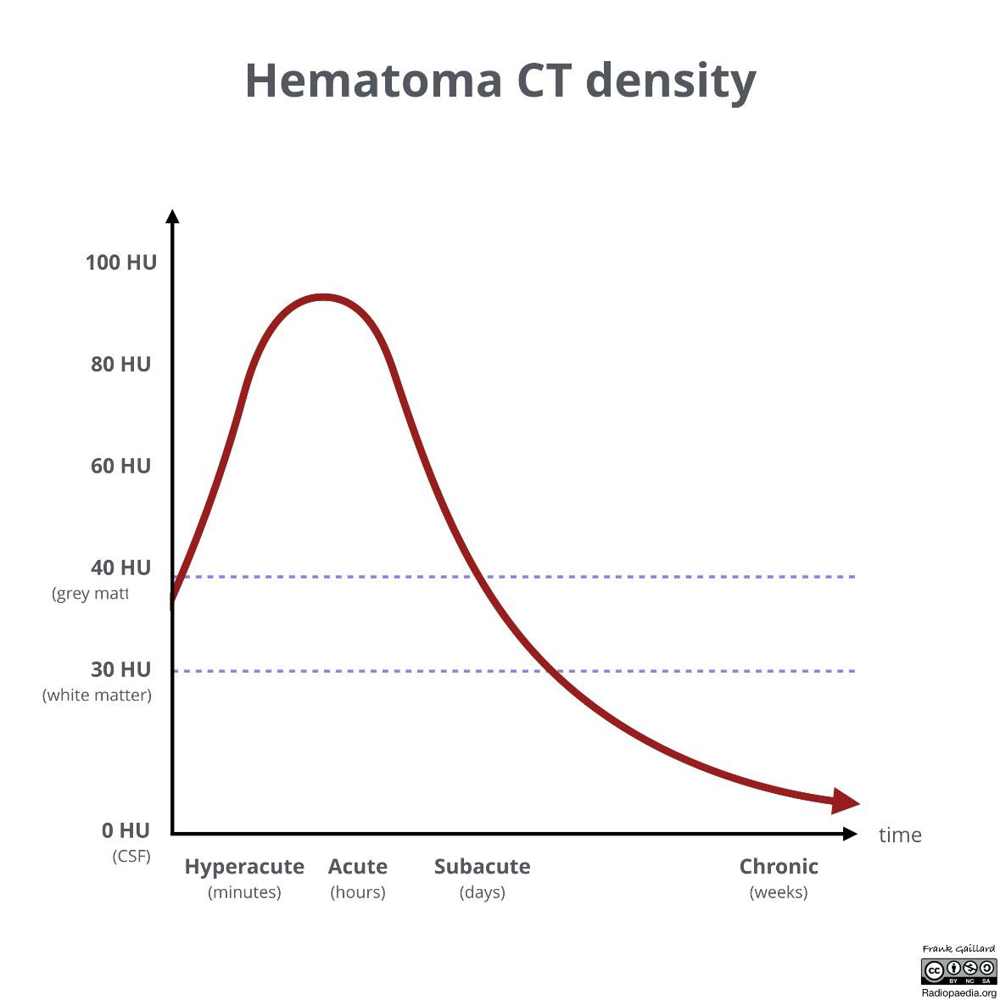

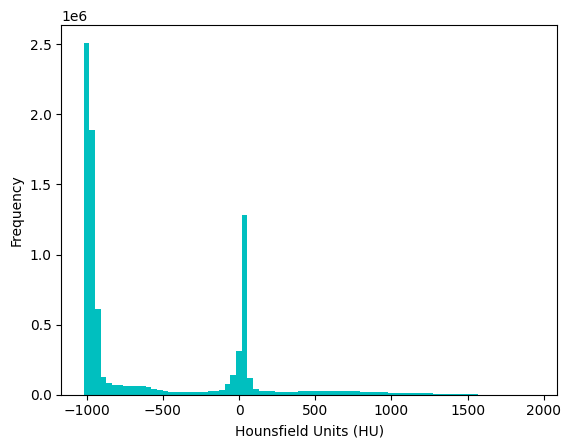

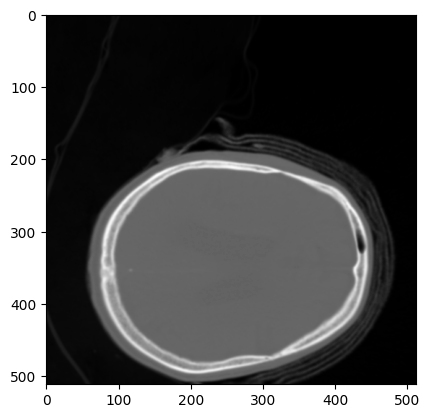

In [9]:
plt.hist(image.flatten(), bins=80, color='c')
plt.xlabel("Hounsfield Units (HU)")
plt.ylabel("Frequency")
plt.show()

plt.imshow(image[:,:,20], cmap=plt.cm.gray)
plt.show()

In [10]:
def window_image(image, window_center, window_width):
    img_min = window_center - window_width // 2
    img_max = window_center + window_width // 2
    window_image = image.copy()
    window_image[window_image < img_min] = img_min
    window_image[window_image > img_max] = img_max
    return (window_image - img_min) / (img_max - img_min) * 255

Az ablakozás a CT képek kontrasztjának és fényerejének beállítását jelenti. Két fő paramétert használunk:
* Ablak szintje (window level, WL): Ez az érték határozza meg a középpontot a Hounsfield-skálán, amelyet a kép közepére helyezünk.
* Ablak szélessége (window width, WW): Ez az a tartomány, amelyet megjelenítünk. Az ablakozási tartományon belüli HU értékek jól láthatók, míg az ezen kívüli értékek vagy teljesen fehérek, vagy teljesen feketék lesznek.

Agyi CT felvégeleknél  a WL: 40, WW: 80 értékeket szokták használni. Jól látszik a lenit és fenti képek közötti különbség (ugyan azt a szelet látható rajtuk), az ablakozás után sokkal részletesebb képet kaptunk.

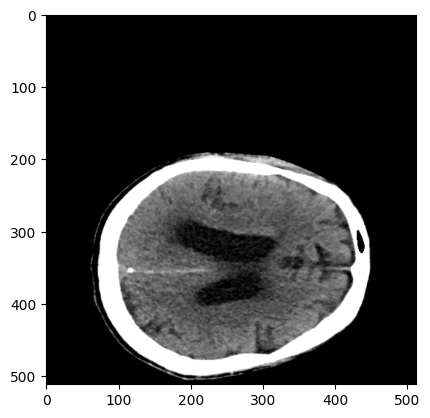

In [19]:
windowed_image = window_image(image, 40, 80) # W: 40, WW: 80

plt.imshow(windowed_image[:,:,20], cmap=plt.cm.gray)
plt.show()

In [8]:
def calc_optimal_dimension(shape, slice_thickness, pixel_spacing, new_spacing=[1,1,1]):
    spacing = np.array([pixel_spacing[0], pixel_spacing[1], slice_thickness], dtype=np.float32)
    resize_factor = spacing / new_spacing
    new_real_shape = shape * resize_factor
    new_shape = np.round(new_real_shape)
    real_resize_factor = new_shape / shape
    new_spacing = spacing / real_resize_factor
    return new_real_shape

def resample(data, slice_thickness, pixel_spacing):
    new_dim = calc_optimal_dimension(data.shape, slice_thickness, pixel_spacing, new_spacing=[1,1,1])
    resized_data = resize(data, new_dim, mode='constant')
    return resized_data

A különböző síkokban (axialis, coronalis, sagittalis) készített CT felvételek gyakran eltérő térbeli felbontással rendelkeznek. A resampling segít egységesíteni a voxelméreteket minden síkban, így a háromdimenziós rekonstrukciók és a további képfeldolgozási lépések pontosabbak és konzisztensebbek lesznek.  
A (512, 512, 33) felbontású voxel tömböt (236, 236, 165) ra módosítjuk, a selet vastagság és pixelek közötti távolsággal számólható az új dimnezió, mellyel egy térbeli kockát kapunk (voxel tömböt).

In [12]:
resampled_image = resample(windowed_image, slice_thickness, pixel_spacing)
resampled_mask = resample(mask, slice_thickness, pixel_spacing)

print("resampled image shape ->", resampled_image.shape)

resampled image shape -> (236, 236, 165)


Az alábbiakban gif-ekké alakítom a felvételt (a 3 síkból), a maskok is láthatóak.

Axial

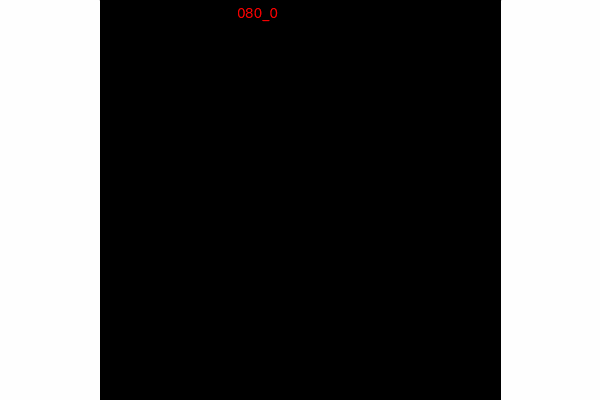

In [ ]:
image_to_show = np.rot90(resampled_image,1 , (0, 2))
mask_to_show = np.rot90(resampled_mask ,1, (0, 2))

gif = ImageToGIF()
label = path.replace('/', '.').split('.')[-2]
filename = f'{label}_3d_2d.gif'

for j in range(image_to_show.shape[0]):
    i = np.rot90(image_to_show[j])
    m = np.clip(np.rot90(mask_to_show[j]), 0, 1)
    gif.add(i, m, label=f'{label}_{str(j)}')

gif.save(filename, fps=15)
show_gif(filename, format='png')

Coronal

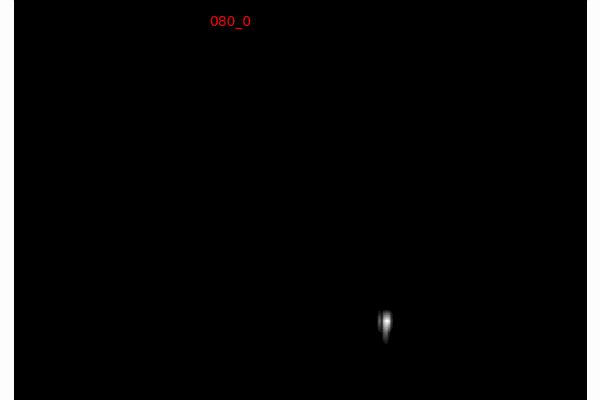

In [ ]:
image_to_show = np.rot90(resampled_image,1 , (0, 1))
mask_to_show = np.rot90(resampled_mask ,1, (0, 1))

gif = ImageToGIF()
label = path.replace('/', '.').split('.')[-2]
filename = f'{label}_3d_2d.gif'

for j in range(image_to_show.shape[0]):
    i = np.rot90(image_to_show[j])
    m = np.clip(np.rot90(mask_to_show[j]), 0, 1)
    gif.add(i,m,label=f'{label}_{str(j)}')

gif.save(filename, fps=15)
show_gif(filename, format='png')

Sagittal

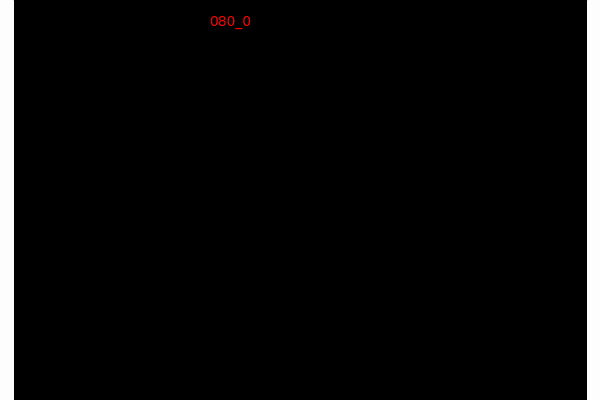

In [ ]:
image_to_show = np.rot90(resampled_image,1 , (1, 2))
mask_to_show = np.rot90(resampled_mask ,1, (1, 2))
gif = ImageToGIF()
label = path.replace('/', '.').split('.')[-2]
filename = f'{label}_3d_2d.gif'

for j in range(image_to_show.shape[0]):
    i = (image_to_show[j])
    m = np.clip((mask_to_show[j]), 0, 1)
    gif.add(i,m,label=f'{label}_{str(j)}')

gif.save(filename, fps=15)
show_gif(filename, format='png')

Itt kilistáztam az összes axiális szeletet jelölve rajtuk a vérzést.

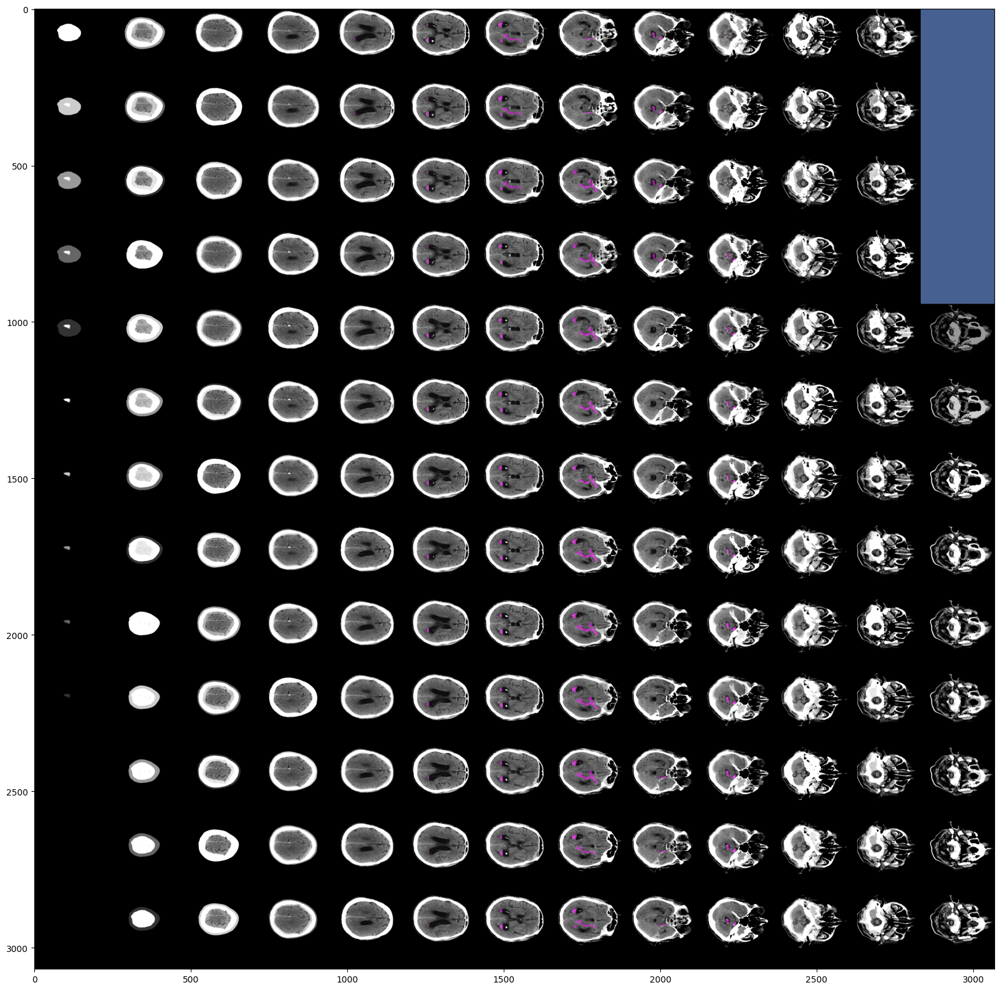

In [ ]:
image_to_show = np.rot90(resampled_image,1 , (0, 2))
mask_to_show = np.rot90(resampled_mask ,1, (0, 2))

mediacal_image = np.rot90(montage(image_to_show))
mask_img = np.rot90(montage(mask_to_show))
mask_img = np.clip(mask_img, 0, 1)

fig, ax1 = plt.subplots(1, 1, figsize = (20, 20))
ax1.imshow(mediacal_image, cmap ='gray')
ax1.imshow(np.ma.masked_where(mask_img == False, mask_img),
           cmap='cool', alpha=0.5, animated=True)
#fig.savefig(f'{label}_3d_to_2d.png', format='png', bbox_inches='tight')

In [42]:
def plot_3d(image, threshold=-300):
    verts, faces, normals, values = measure.marching_cubes(image, threshold)

    fig = plt.figure(figsize=(11, 10))
    ax = fig.add_subplot(111, projection='3d')

    mesh = Poly3DCollection(verts[faces], alpha=0.40)
    ax.add_collection3d(mesh)

    ax.set_xlim(0, image.shape[0])
    ax.set_ylim(0, image.shape[1])
    ax.set_zlim(0, image.shape[2])

    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')

    plt.show()

In [43]:
resampled_not_windowed_image = resample(image, slice_thickness, pixel_spacing)
resampled_not_windowed_mask = resample(mask, slice_thickness, pixel_spacing)

resampled_not_windowed_image = np.rot90(resampled_not_windowed_image, 3, (0,1))
resampled_not_windowed_mask = np.rot90(resampled_not_windowed_mask, 3, (0,1))

merged_array = np.copy(resampled_not_windowed_image)

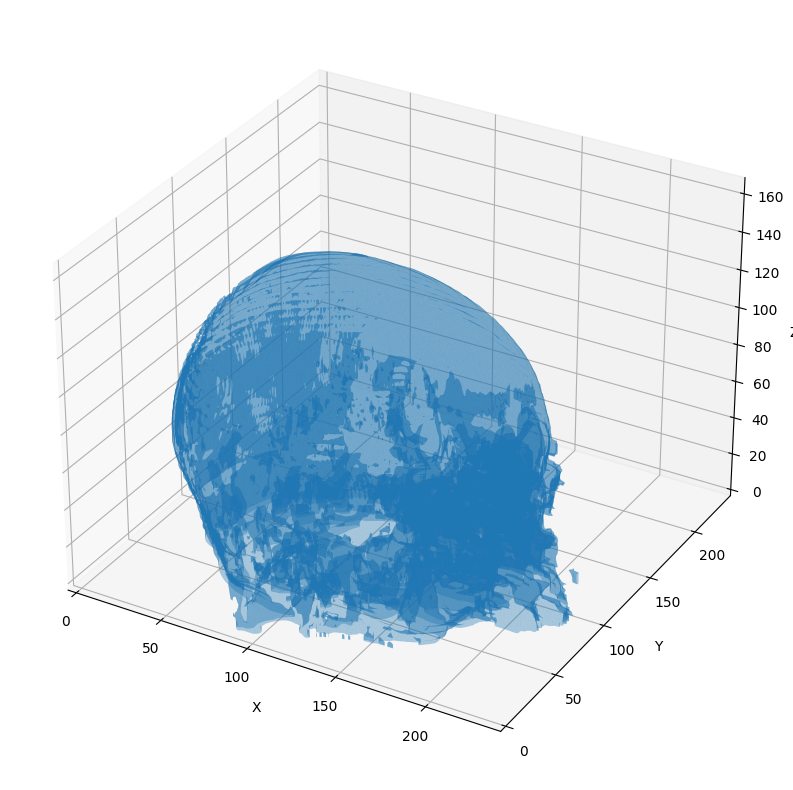

In [44]:
plot_3d(merged_array,0)

In [32]:
def plot_3d_rgb(image, lim):
    x, y, z = image.nonzero()

    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    ax.scatter(x,y,z, zdir='z', c=image[x,y,z], cmap='gray')
    ax.set_xlim(0, lim[0])
    ax.set_ylim(0, lim[1])
    ax.set_zlim(0, lim[2])
    plt.show()

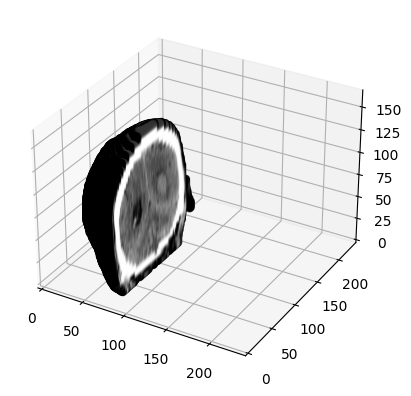

In [34]:
img_to_show = np.rot90(resampled_image[:, 0:80, :], 3, (0,1))
plot_3d_rgb(img_to_show, resampled_image.shape)

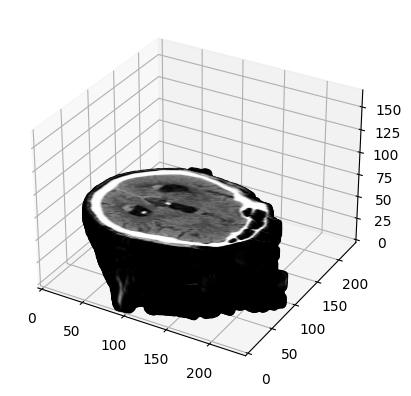

In [35]:
img_to_show = np.rot90(resampled_image[:, :, 0:78], 3, (0,1))
plot_3d_rgb(img_to_show, resampled_image.shape)